In [ ]:
!pip install gdown
!gdown https://drive.google.com/uc?id=1dkbuj5pkJHmcIkV16yP2wey3FFAqBEjQ

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Downloading...
From: https://drive.google.com/uc?id=1dkbuj5pkJHmcIkV16yP2wey3FFAqBEjQ
To: /content/earnings.csv
100% 668k/668k [00:00<00:00, 86.5MB/s]


In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
from statsmodels.graphics.gofplots import qqplot
from plotly.subplots import make_subplots
from sklearn.cluster import KMeans, AgglomerativeClustering
from scipy.cluster import hierarchy 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score

In [ ]:
earnings = pd.read_csv('earnings.csv', sep=';')
earnings = earnings.drop(columns=['id'])  # We don't need ids.
display(earnings.head())
print(earnings.isna().sum())

,base,bonus,overtime_pay,other,sector,section_07,sex,education,contract,age,duration_total,duration_entity,duration_nominal,duration_overtime
0,26651.53,0.0,0.00,0.00,1,3,2,4,1,49,33.03,7.06,1524.15,0.0
1,40168.50,1500.0,0.00,3414.32,1,2,1,1,1,36,10.07,6.01,1562.40,0.0
2,20134.80,0.0,0.00,1700.41,1,2,2,4,1,52,28.08,19.05,1816.00,0.0
3,16475.00,0.0,0.00,1305.00,1,2,2,5,1,55,35.07,11.01,1816.00,0.0
4,34797.60,0.0,1893.35,3118.73,1,2,2,2,1,50,27.00,19.01,722.80,63.0


base                 0
bonus                0
overtime_pay         0
other                0
sector               0
section_07           0
sex                  0
education            0
contract             0
age                  0
duration_total       0
duration_entity      0
duration_nominal     0
duration_overtime    0
dtype: int64


## Task 1

Dataset consists of 11000 rows. There are 10 quantitative (or rather 9 because one of them is id which is useless to for any analysis) and 5 qualitative variables. There is no missing data.


In [ ]:
numerical = ['base', 'bonus', 'overtime_pay', 'other', 'age', 'duration_total', 
             'duration_entity', 'duration_nominal', 'duration_overtime']
categorical = ['sector', 'section_07', 'sex', 'education', 'contract']

desc = {
    'base': 'Total of base salaries',
    'bonus': 'Statutory bonuses, awards and discretionary bonuses',
    'overtime_pay': 'Overtime pay',
    'other': 'Remuneration',
    'age': 'Age of the employee as in 2010',
    'duration_total': 'Total duration of employment',
    'duration_entity': 'Duration of employment in the reporting entity',
    'duration_nominal': 'The time actually worked in nominal hours',
    'duration_overtime': 'Time actually worked overtime'
}

sector = {
    1: 'public', 
    2: 'private'
}
section_07 = { # NACE
    1: 'Public Administration and Defence', 
    2: 'Education', 
    3: 'Human Health and Social Work Activities'
}
sex = {
    1: 'man', 
    2: 'woman'
}
education = {
    1: 'doctorate', 
    2: 'higher', 
    3: 'post-secondary', 
    4: 'secondary', 
    5: 'basic vocational', 
    6: 'middle school and below'
}
contract = {
    1: 'for an indefinite period', 
    2: 'for a definite period'
}

earnings['sector'] = earnings.sector.astype('category')
earnings['section_07'] = earnings.section_07.astype('category')
earnings['sex'] = earnings.sex.astype('category')
earnings['education'] = earnings.education.astype('category')
earnings['contract'] = earnings.contract.astype('category')

earnings['sector'] = earnings['sector'].cat.rename_categories(sector.values())
earnings['section_07'] = earnings['section_07'].cat.rename_categories(section_07.values())
earnings['sex'] = earnings['sex'].cat.rename_categories(sex.values())
earnings['education'] = earnings['education'].cat.rename_categories(education.values())
earnings['contract'] = earnings['contract'].cat.rename_categories(contract.values())

In [ ]:
earnings.describe()

,base,bonus,overtime_pay,other,age,duration_total,duration_entity,duration_nominal,duration_overtime
count,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.00000,11000.000000,11000.000000,11000.000000
mean,33376.738065,2128.486176,1679.273923,2477.625815,42.470182,18.56708,11.401382,1301.307435,47.702325
std,19276.551638,4966.444726,5407.964344,3715.419120,10.012140,10.99695,9.322181,540.189234,111.963867
min,10.000000,0.000000,0.000000,0.000000,19.000000,0.01000,0.010000,12.800000,0.000000
25%,20995.115000,0.000000,0.000000,0.000000,34.000000,9.03000,3.070000,766.800000,0.000000
50%,31341.245000,620.000000,0.000000,2141.820000,43.000000,19.03500,9.100000,1591.900000,0.000000
75%,41348.290000,2940.717500,1139.330000,3497.430000,51.000000,27.11000,18.040000,1768.000000,40.000000
max,241624.390000,258061.000000,228110.340000,88555.760000,77.000000,57.02000,46.010000,2024.000000,1812.580000


In [ ]:
for column_name in ['sector', 'section_07', 'sex', 'education', 'contract']: 
    display(pd.crosstab(earnings[column_name], 'count'))

col_0,count
sector,
public,10548
private,452


col_0,count
section_07,
Public Administration and Defence,2401
Education,5867
Human Health and Social Work Activities,2732


col_0,count
sex,
man,2711
woman,8289


col_0,count
education,
doctorate,430
higher,6633
post-secondary,680
secondary,1983
basic vocational,906
middle school and below,368


col_0,count
contract,
for an indefinite period,9306
for a definite period,1694


In [ ]:
for column_name in numerical:
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=earnings[column_name], name=column_name))
    fig.update_layout(title=f'{column_name} - {desc[column_name]}')
    fig.add_vline(x=earnings[column_name].mean())
    fig.show()

Even without using qqplot we can clearly see that most of the variables do not have normal distribution.  
Variables `bonus`, `overtime_pay`, `duration_overtime` look like exponential distributions.  
Variables `base`, `other` (when we remove the first bar for 0), `duration_total` and maybe `duration_entity` look like gamma distributions (so might be close to normal).  
Variable `age` seems to be the only one with real normal distribution.  
Variable `duration_nominal` looks like 2 inversed gamma distributions - one peak for part-time employees and second for full-time employees.

In [ ]:
fig = make_subplots(rows=3, cols=3, subplot_titles=[desc[name] for name in numerical])

for i, column_name in enumerate(numerical, 0):
    row = i // 3 + 1
    col = i % 3 + 1
    qqplot_data = qqplot(earnings[column_name], line='s').gca().lines
    fig.add_trace(
        go.Scatter(x=qqplot_data[0].get_xdata(), y=qqplot_data[0].get_ydata(), name=column_name, mode='markers'),
        row=row, col=col
    )
    fig.add_trace(
        go.Scatter(x=qqplot_data[1].get_xdata(), y=qqplot_data[1].get_ydata(), mode='lines'),
        row=row, col=col
    )
    plt.gca().remove()

fig.update_layout(height=1000, width=1400, title_text="Q-Q plots")
fig.show()

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

We see that only `age` variable seems to follow normal distribution. 
Also `duration_total` and `duration_entity` would be close to normal distribution if not the tails on 0 (however, they look a little bit similar to gamma distribution).


## Task 2

We will check all possible correlations. First, we will look for correlations between numerical variables, then numerical and categorical and at the end only categorical.

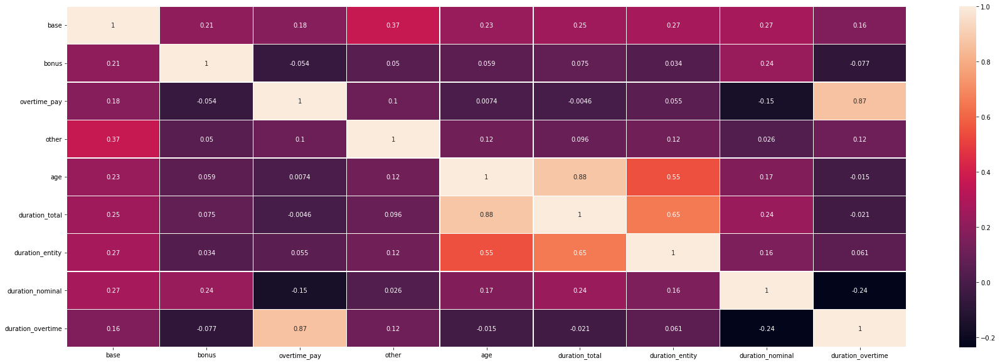

In [ ]:
plt.figure(figsize=(30, 10))
sns.heatmap(earnings.corr(), annot=True, linewidths=0.5)
plt.show()

Between numerical variables we see only some trivial correlations:
- amount of money received for overtime work correlates with time spent on overtime work
- total duration of employment, duration of employment in a reporting entity and age correlate with each other

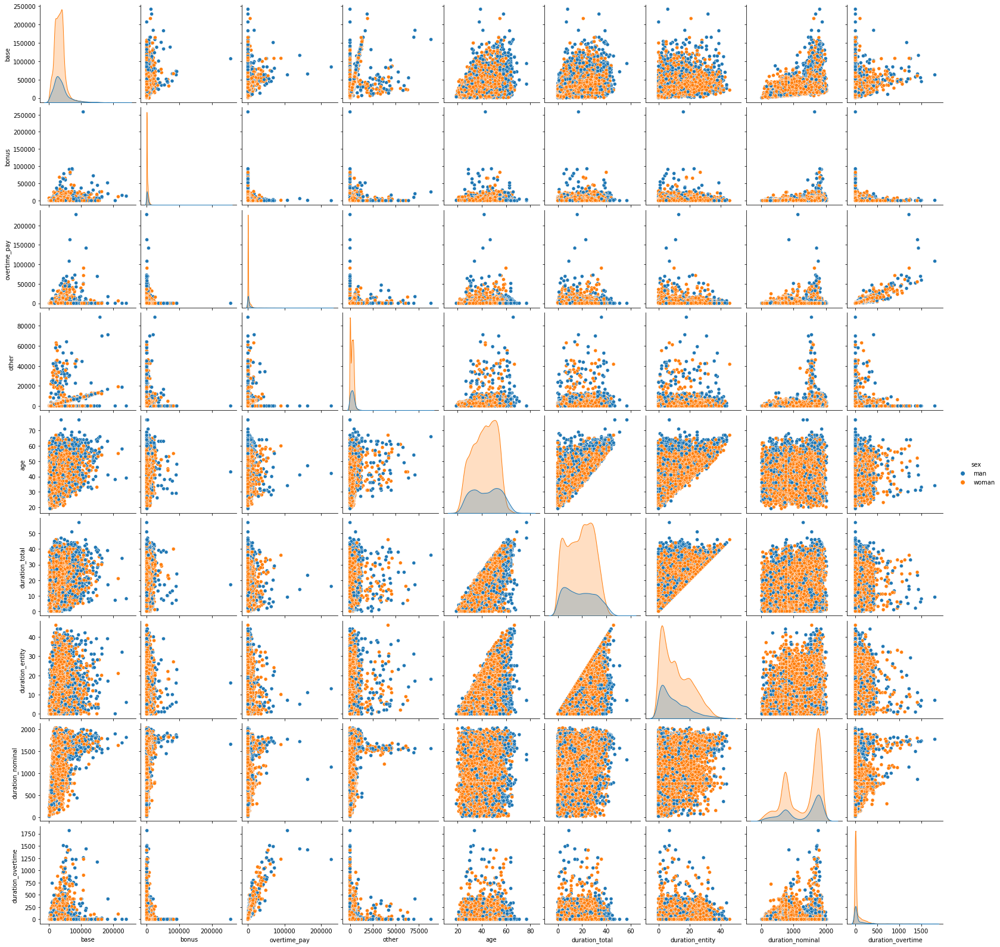

In [ ]:
# Generating plots may take some time.
sns.pairplot(earnings, hue="sex")

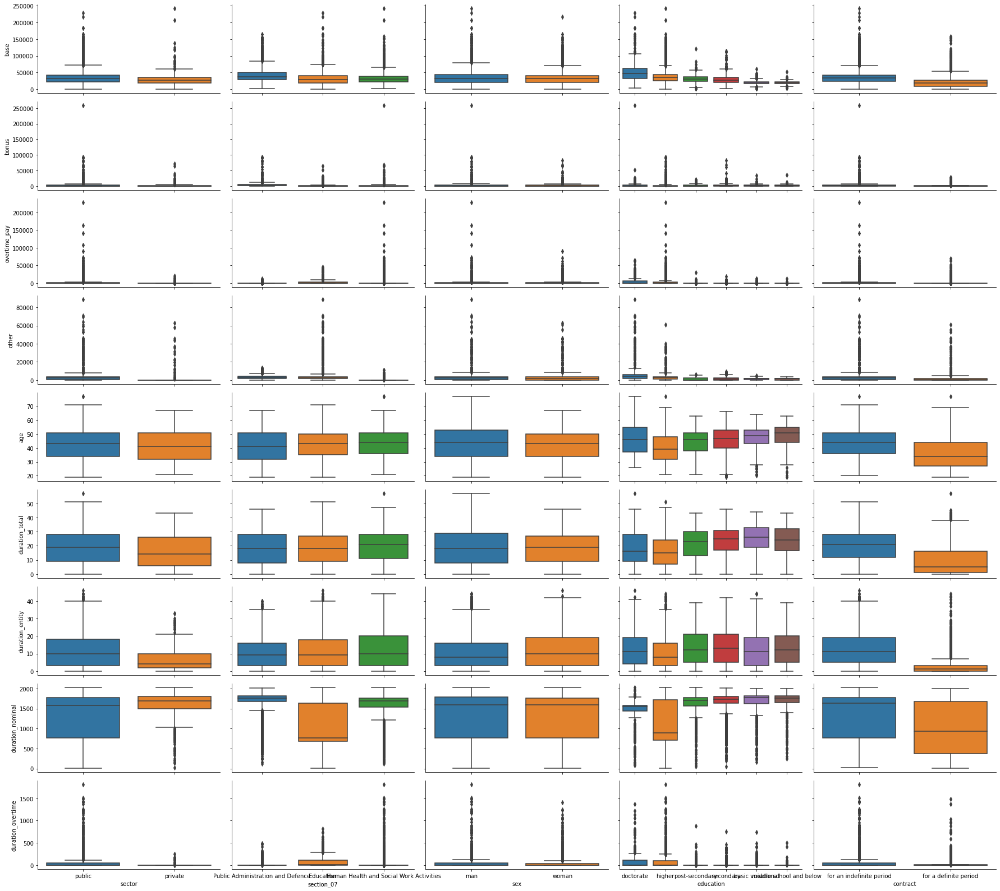

In [ ]:
g = sns.PairGrid(data=earnings, x_vars=categorical, y_vars=numerical, aspect=2)
g.map(sns.boxplot)

When comparing categorical and numerical variables we see that:
- base salary and work duration (both total and in current entity) are bigger in public sector
- education sector is the only one where overtime is notable but this sector has shorter nominal duration than others (so overtime probably compensates this)
- workers in healthcare tend to work longer in current entity than in other sectors
- base salary is visibly higher in public administration and defence than in other sectors
- women have a little bit longer work duration in current entity than men
- people with higher education tend to have some notable overtime duration but they also have less nominal duration than others
- quite expectedly we see that base salary rises with level of education
- people with definite contracts work shorter nominally, spend less years in current entity and have lower salary - that's also not surprising



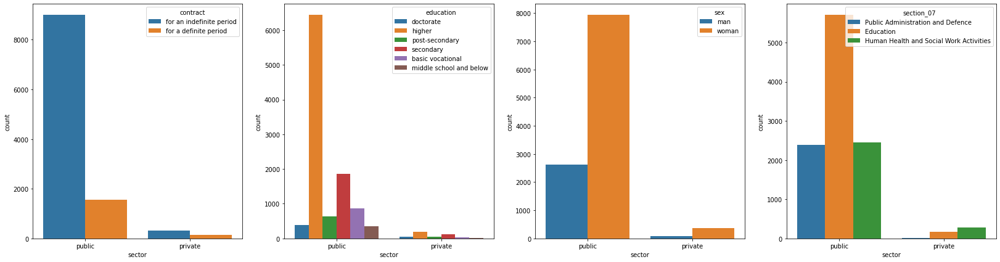

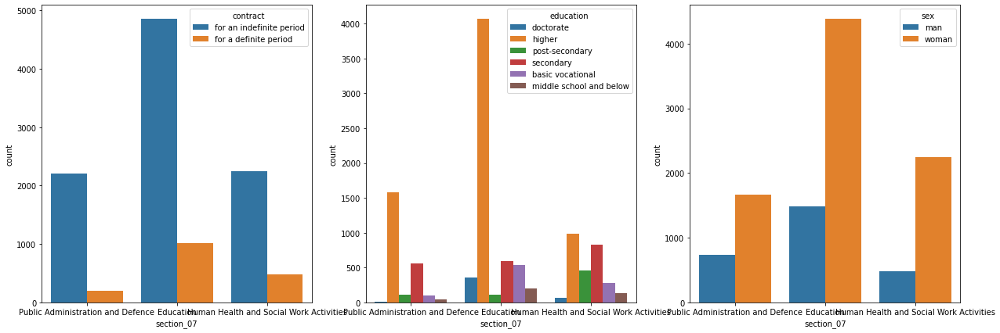

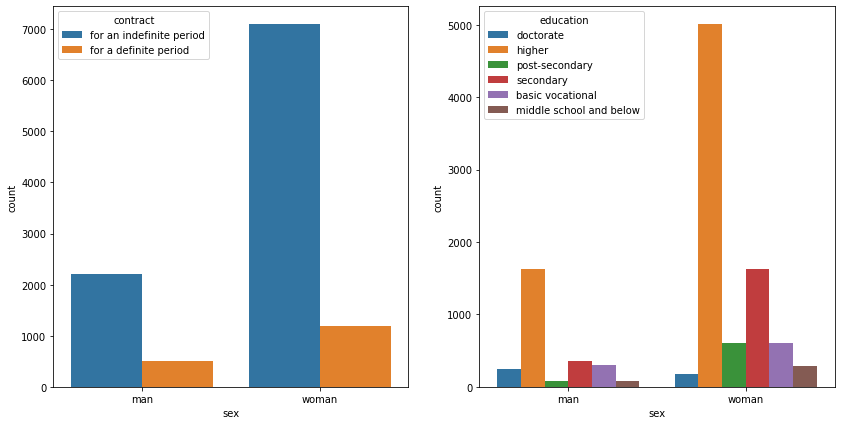

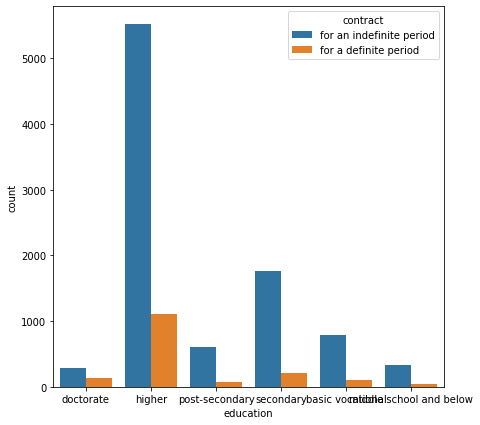

In [ ]:
other = categorical.copy()
for cat_var1 in categorical[:-1]:
    other.remove(cat_var1)
    fig, plots = plt.subplots(1, len(other), figsize=(len(other) * 7, 7))
    plots = [plots] if len(other) == 1 else plots
    
    for i, cat_var2 in enumerate(reversed(other)):
        sns.countplot(data=earnings, x=cat_var1, hue=cat_var2, ax=plots[i])
    
    plt.show()

At the end we compare only categorical variables and get following conclusions:
- we have very little data about private sector, most of the dataset are records of employees in public sector, so comparison of those sectors may not give correct results
- most of the employees have indefinite contracts 
- women are more numerous in the dataset than men, ratio is approximately 3:1
- education sector has more employees with higher or doctorate education - that's not really suprising
- there is nearly the same number of men with doctorate as women with doctorate even though there are 3 times more women in dataset 
- surprisingly, people with doctorate more often have contracts for definite period than people with lower education (it seems nearly 1/3 of people with doctorate have those contracts)


## Task 3

In [ ]:
salary_components = ['base', 'bonus', 'overtime_pay', 'other']
selected_variables = ['age', 'duration_entity', 'duration_nominal']  # Compare with those variables

# Scatter plots
fig = make_subplots(rows=len(selected_variables), cols=len(salary_components))

for row, variable in enumerate(selected_variables, 1):
    for col, salary_comp in enumerate(salary_components, 1):

        fig.add_trace(
            go.Scatter(x=earnings[variable], y=earnings[salary_comp], mode='markers'),
            row=row, col=col
        )
        fig.update_xaxes(title_text=variable, row=row, col=col)
        fig.update_yaxes(title_text=salary_comp, row=row, col=col)

fig.update_layout(height=1000)
fig.show()

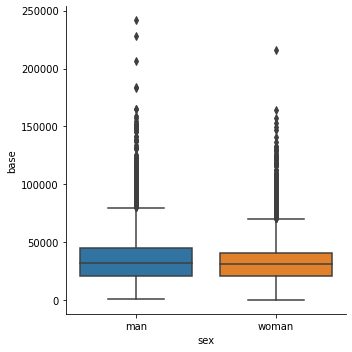

In [ ]:
# Boxplot
_ = sns.catplot(data=earnings, x='sex', y='base', kind='box')

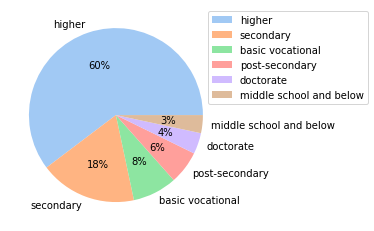

In [ ]:
# Pie chart
percentages = earnings['education'].value_counts() / 100
data = percentages
labels = percentages.index.tolist()
colors = sns.color_palette('pastel')[0:len(labels)]

patches, _, _ = plt.pie(data, labels=labels, colors=colors, autopct='%.0f%%')
plt.legend(patches, labels, bbox_to_anchor=(0.9, 1.0))
plt.show()

Commentary:  
1. 
    - It seems that base salary rises with age. 
    - Bonus salary seems to get slightly lower with time of working in current entity.
    - Salary for overtime rises together with base salary, peaks for around 50k-60k base salary and then goes down. People with base salary > 100k don't seem to get any overtime pay (because they probably don't work overtime at all).
2. Base salary of men and women is nearly equal. Men seem to have slightly higher salary but difference is very small.
3. More than half of the employees present in the dataset have higher education. 

Additional visualizations are already presented in task 2.

## Task 4

In [ ]:
age = earnings['age']

n = len(age)
mean = np.mean(age)
std = np.std(age)
var = np.var(age)
var_unbiased = np.var(age, ddof=1)
alpha = 0.01

# When calculating intervals we assume that age is normal.
# I think it is justified because we can see in qqplot that age distribution is nearly normal.

mean_interval = (
    mean - std / np.sqrt(n - 1) * stats.t.ppf(1 - alpha / 2, n - 1), 
    mean + std / np.sqrt(n - 1) * stats.t.ppf(1 - alpha / 2, n - 1)
)

# Formula from the lecture - it uses biased variance estimator.
var_interval = (
    n * var / stats.chi2.ppf(1 - alpha / 2, n - 1),
    n * var / stats.chi2.ppf(alpha / 2, n - 1)
)

# Formula for median confidence interval comes from "Practical Nonparametric Statistics", 3rd Edition by W.J. Conover.
z = 2.58  # Value for confidence level 0.99
quantile = 0.5  # Median is exactly in half of the distribution
interval_indices = (
    n * quantile - z * np.sqrt(n * quantile * (1 - quantile)),
    n * quantile + z * np.sqrt(n * quantile * (1 - quantile))
)
interval_indices = np.round(interval_indices).astype(int)
median_interval = np.sort(age)[interval_indices]

print(f'Mean confidence interval: {mean_interval}')
print(f'Variance confidence interval: {var_interval}')
print(f'Median confidence interval: {median_interval}')

Mean confidence interval: (42.22424529423357, 42.71611834213007)
Variance confidence interval: (96.84602609043314, 103.81334720276196)
Median confidence interval: [43 43]


## Task 5

In [ ]:
significance_level = 0.01

In [ ]:
# There are significant differences between the base salary of the employees of the public and private sector.
# H0: base salary in public and private sector distributions is equal
# H1: salary distributions are NOT equal
# We use Mann-Whitney U test because samples are not normally distributed.

# Independence assumption is correct here because public and private sector employees are two different populations.

_, pvalue = stats.mannwhitneyu(
    earnings[earnings['sector'] == 'public']['base'], 
    earnings[earnings['sector'] == 'private']['base']
)
print(f'pvalue={pvalue} {"<" if pvalue < significance_level else ">="} {significance_level}')

# Therefore, we reject H0 and get that salary in private and public distributions is NOT equal.

pvalue=7.238146961753935e-09 < 0.01


In [ ]:
# Among employees that are younger than 30 years old, the mean total duration of the
# employment is equal to the mean total duration of the employment in the reporting entity.

# H0: total duration mean is equal to mean of duration of employment in reporting entity
# H1: duration means are NOT equal

# We will use t-test for related samples because given variables
# may be related because total duration depends on duration in reporting entity 
# (e.g. somebody is working in the same entity since the begining of their career)
# T-test also assumes normality but because we have a lot of samples in dataset then
# by the central limit theorem we can use this test on our data.

_, pvalue = stats.ttest_rel(
    earnings[earnings['age'] < 30]['duration_total'],
    earnings[earnings['age'] < 30]['duration_entity']
)

print(f'pvalue={pvalue} {"<" if pvalue < significance_level else ">="} {significance_level}')

# Therefore, we reject H0 and get that duration means are NOT equal.

pvalue=1.1380963469260252e-80 < 0.01


In [ ]:
# A shorter total duration of the employment is correlated with the longer time actually worked overtime.
# H0: there is NO correlation at all between total duration and overtime duration
# H1: total work duration is INVERSELY correlated with overtime duration

# Use Spearman test because variables are not normally distributed and this test doesn't
# have any assumptions about distribution. 

# alternative=less means alternative=negatively(inversely) correlated 
corr_coef, pvalue = stats.spearmanr(earnings['duration_total'], earnings['duration_overtime'], alternative='less')

print(f'Correlation coefficient={corr_coef:.5f} with pvalue={pvalue:.7f} {"<" if pvalue < significance_level else ">="} {significance_level}')

# Therefore, we should reject H0 - variables are inversely correlated. 
# However this correlation is very weak - correlation coefficient is very close to 0. 

Correlation coefficient=-0.04541 with pvalue=0.0000009 < 0.01


## Task 6

In [ ]:
# We want to compare base salary between private and public sector.
# H0: variance of base salary is equal for private and public sector
# H1: variances are different for both sectors

# We will use Leven test because base salary is not normally distributed 
# and this test works better than F-test for such data.
# There are no other special assumptions (independent observations assumption is trivial).

private = earnings[earnings['sector'] == 'private']['base']
public = earnings[earnings['sector'] == 'public']['base']

_, pvalue = stats.levene(private, public, center='median')
print(f'pvalue={pvalue} {"<" if pvalue < significance_level else ">="} {significance_level}')

# We CANNOT reject H0 because pvalue is bigger than significance level.

pvalue=0.19875543006086424 >= 0.01


In [ ]:
salary_components = ['base', 'bonus', 'overtime_pay', 'other']

for salary_comp in salary_components:
    print(f'H0: {salary_comp} salary distribution is the same for administration employees and workers of other sections')
    print('H1: distributions are different')
    
    administration = earnings[earnings['section_07'] == 'Public Administration and Defence'][salary_comp]
    others = earnings[earnings['section_07'] != 'Public Administration and Defence'][salary_comp]

    # We use standard Kolmogorov-Smirnov test.
    # We assume that base salary distribution is continuous. 
    # Money is not really continuous but it is "continuous enough".
    _, pvalue = stats.kstest(administration, others)
    print(f'H0 is {"rejected" if pvalue < significance_level else "NOT rejected"} with '
          f'pvalue={pvalue} {"<" if pvalue < significance_level else ">="} {significance_level}\n')

# We reject all but one null hypotheses. 
# As far as I know the result of the second test (the one that is not rejected) depends on currently used scipy version.
# When using newer scipy we would reject second H0.   

H0: base salary distribution is the same for administration employees and workers of other sections
H1: distributions are different
H0 is rejected with pvalue=1.6848693459678178e-79 < 0.01

H0: bonus salary distribution is the same for administration employees and workers of other sections
H1: distributions are different
H0 is NOT rejected with pvalue=0.11454676813404996 >= 0.01

H0: overtime_pay salary distribution is the same for administration employees and workers of other sections
H1: distributions are different
H0 is rejected with pvalue=2.0951475396824293e-06 < 0.01

H0: other salary distribution is the same for administration employees and workers of other sections
H1: distributions are different
H0 is rejected with pvalue=2.5433382619597956e-95 < 0.01



In [ ]:
# H0: bonus comes from the exponential distribution with lambda=100
# H1: bonus comes from other distribution

# Once again we use Kolmogorov-Smirnov test. 
# And once again we assume that money is "continuous enough" to satisfy contiuity assumption.

# lambda translates here to loc = 0 and scale = 1 / lambda
_, pvalue = stats.kstest(earnings['bonus'], stats.expon.cdf, (0, 1 / 100))
print(f'pvalue={pvalue} {"<" if pvalue < significance_level else ">="} {significance_level}')

# We reject H0, bonus comes from other distribution.

pvalue=0.0 < 0.01


## Task 7

In [ ]:
administration = earnings[earnings['section_07'] == 'Public Administration and Defence']
# We will use three variables which in my opinion may have the biggest impact on the 
# possibility of strike: duration_nominal, duration_overtime, base.
# (I tried to use also other variables but they didn't make much of a difference and 
# they were lowering the silhouette score.) 

# We scale all three variables because they have different scales and variances. We want 
# them to look similar. 
selected_variables = ['duration_nominal', 'duration_overtime', 'base']
initial_data = administration[selected_variables].copy()
scaler = StandardScaler()
scaler.fit(initial_data)
data = scaler.transform(initial_data)
data = pd.DataFrame(data, columns=selected_variables)

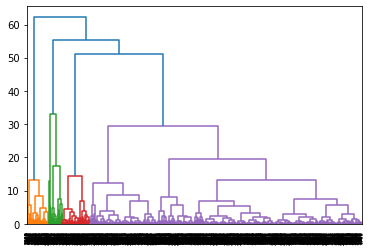

In [ ]:
# First, use hierarchical clustering with dendrogram to find optimal number of clusters.
clustering = hierarchy.linkage(data, method='ward')
dendrogram = hierarchy.dendrogram(clustering, )

On dendrogram we see that 4 may be optimal number of clusters.  
Let's use hierarchical clustering and standard kmeans with different numbers of clusters 
and compare the silhouette scores.

In [ ]:
for n_clusters in range(2, 10):
    print(f'n_clusters={n_clusters}')

    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward').fit(data)
    score = silhouette_score(data, model.labels_)
    print(f'AgglomerativeClustering score: {score}, linkage=ward')

    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='average').fit(data)
    score = silhouette_score(data, model.labels_)
    print(f'AgglomerativeClustering score: {score}, linkage=average')

    model = KMeans(n_clusters=n_clusters, random_state=17).fit(data)
    score = silhouette_score(data, model.labels_)
    print(f'KMeans score: {score}')

n_clusters=2
AgglomerativeClustering score: 0.6182312469774898, linkage=ward
AgglomerativeClustering score: 0.8732176173209066, linkage=average
KMeans score: 0.60297459412738
n_clusters=3
AgglomerativeClustering score: 0.6412715963098197, linkage=ward
AgglomerativeClustering score: 0.7562093812406225, linkage=average
KMeans score: 0.6312849431885899
n_clusters=4
AgglomerativeClustering score: 0.5920283495920836, linkage=ward
AgglomerativeClustering score: 0.7513549179719664, linkage=average
KMeans score: 0.5662157180318019
n_clusters=5
AgglomerativeClustering score: 0.5965980288458329, linkage=ward
AgglomerativeClustering score: 0.6479446990764764, linkage=average
KMeans score: 0.41491387187742274
n_clusters=6
AgglomerativeClustering score: 0.4119511371819478, linkage=ward
AgglomerativeClustering score: 0.6455039187254324, linkage=average
KMeans score: 0.41944729185380053
n_clusters=7
AgglomerativeClustering score: 0.37838387949591457, linkage=ward
AgglomerativeClustering score: 0.6445

We can see that AgglomerativeClustering with linkage=average has overall the best silhouette scores and optimal number of clusters is 2.  
However, for KMeans and AgglomerativeClustering with linkage=ward optimal number of clusters is 3. (So number of clusters is different than suggested by dendrogram.)  
We will make 3 visualization.

In [ ]:
def plot_clusters(model, data):
    fig = make_subplots(rows=1, cols=3)
    fig.add_trace(
        go.Scatter(x=data['duration_nominal'], y=data['duration_overtime'], mode='markers', marker={'color': model.labels_}),
        row=1, col=1
    )
    fig.update_xaxes(title_text='duration_nominal', row=1, col=1)
    fig.update_yaxes(title_text='duration_overtime', row=1, col=1)
    fig.add_trace(
        go.Scatter(x=data['duration_nominal'], y=data['base'], mode='markers', marker={'color': model.labels_}),
        row=1, col=2
    )
    fig.update_xaxes(title_text='duration_nominal', row=1, col=2)
    fig.update_yaxes(title_text='base', row=1, col=2)
    fig.add_trace(
        go.Scatter(x=data['duration_overtime'], y=data['base'], mode='markers', marker={'color': model.labels_}),
        row=1, col=3
    )
    fig.update_xaxes(title_text='duration_overtime', row=1, col=3)
    fig.update_yaxes(title_text='base', row=1, col=3)
    fig.show()

In [ ]:
# We fit on scaled data and plot using initial, not transformed data.
model = AgglomerativeClustering(n_clusters=2, linkage='average').fit(data)
plot_clusters(model, initial_data)

In [ ]:
model = AgglomerativeClustering(n_clusters=3, linkage='ward').fit(data)
plot_clusters(model, initial_data)

In [ ]:
model = KMeans(n_clusters=3, random_state=17).fit(data)
plot_clusters(model, initial_data)

With two clusters we see that second cluster is very small.
It seems that for two clusters the most important factor is overtime duration.
When overtime duration is extremely big employees are assigned to second cluster.

For three clusters we can see that base salary and nominal duration are not that important here and overtime duration is still a major factor. 

My interpretation would be that no matter how good employee's salary is, if it has to work overtime too much, it may be prone to striking.